# Import libraries


In [1]:
import numpy as np  # NumPy for numerical operations
import pandas as pd  # Pandas for data manipulation

pd.set_option("display.max_columns", None)  # Display all columns in Pandas DataFrames

# Import statistical and machine learning libraries
from scipy import stats  # SciPy for scientific and statistical functions

# Import data visualization libraries
import matplotlib.pyplot as plt  # Matplotlib for basic plotting
import matplotlib.gridspec as gridspec
import seaborn as sns  # Seaborn for enhanced data visualization
import plotly.express as px  # Plotly Express for interactive visualizations

# Import preprocessing tools
from sklearn.preprocessing import LabelEncoder  # LabelEncoder for encoding categorical variables

# Model Selection
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

# Import machine learning models
from sklearn.experimental import enable_hist_gradient_boosting # Enable Histogram-Based Gradient Boosting
from sklearn.ensemble import (
    HistGradientBoostingClassifier,  # Histogram-Based Gradient Boosting Classifier
    GradientBoostingClassifier,  # Gradient Boosting Classifier
    AdaBoostClassifier,  # AdaBoost Classifier
    RandomForestClassifier,  # Random Forest Classifier
    ExtraTreesClassifier,  # Extra Trees Classifier
    VotingClassifier,  # Ensemble Voting Classifier
    StackingClassifier,  # Stacking Classifier
)

from xgboost import XGBClassifier  # XGBoost Classifier
from lightgbm import LGBMClassifier # lightgbm Classifier

# Import evaluation metrics
from sklearn.metrics import f1_score  # F1-score for model evaluation

from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler

from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

# Suppress warnings to improve code readability
import warnings

warnings.filterwarnings("ignore")

C:\Users\xiong\AppData\Roaming\Python\Python310\site-packages\sklearn\experimental\enable_hist_gradient_boosting.py:15: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


# Import Data

In [2]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')
sample_submission = pd.read_csv('data/sample_submission.csv')
origin = pd.read_csv('data/horse.csv')

# Add a new column 'is_generated' to the 'train' DataFrame and set all values to 1
train["is_generated"] = 1

# Add a new column 'is_generated' to the 'test' DataFrame and set all values to 1
test["is_generated"] = 1

# Add a new column 'is_generated' to the 'origin' DataFrame and set all values to 0
origin["is_generated"] = 0

# Drop the 'id' column from the 'train' DataFrame
train.drop('id', axis=1, inplace=True)

# Drop the 'id' column from the 'test' DataFrame
test.drop('id', axis=1, inplace=True)

# Concatenate the 'train' and 'origin' DataFrames along rows, ignoring index, and store the result in 'train_total'
train_total = pd.concat([train, origin], ignore_index=True)

# Remove duplicate rows from the 'train_total' DataFrame, if any
train_total.drop_duplicates(inplace=True)

# Concatenate the 'train_total' and 'test' DataFrames along rows, ignoring index, and store the result in 'total'
total = pd.concat([train_total, test], ignore_index=True)

# Print the shapes of the three DataFrames: 'train', 'test', and 'total'
print('The shape of the train data:', train.shape)
print('The shape of the test data:', test.shape)
print('The shape of the total data:', total.shape)

train

The shape of the train data: (1235, 29)
The shape of the test data: (824, 28)
The shape of the total data: (2358, 29)


,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated
0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,absent,slight,slight,less_1_liter,6.5,decreased,distend_small,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,died,1
1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,mild_pain,absent,moderate,none,more_1_liter,2.0,absent,distend_small,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,euthanized,1
2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,extreme_pain,hypomotile,moderate,slight,none,3.5,NaN,distend_large,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,lived,1
3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,mild_pain,hypomotile,moderate,slight,more_1_liter,2.0,decreased,distend_small,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,lived,1
4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,alert,hypomotile,none,slight,less_1_liter,7.0,normal,normal,47.0,7.3,cloudy,2.6,no,0,0,0,yes,lived,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1230,yes,adult,535246,38.5,129.0,48.0,cool,reduced,pale_pink,more_3_sec,depressed,absent,moderate,none,more_1_liter,2.0,NaN,distend_large,57.0,66.0,serosanguious,2.0,yes,2206,0,0,no,lived,1
1231,yes,adult,528570,37.5,60.0,50.0,cool,reduced,pale_cyanotic,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,decreased,distend_small,35.0,6.4,serosanguious,3.6,yes,2209,0,0,yes,died,1
1232,yes,young,529685,37.5,84.0,40.0,normal,reduced,normal_pink,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,increased,firm,40.0,5.9,cloudy,7.0,yes,400,0,0,yes,lived,1
1233,yes,adult,534784,38.1,70.0,16.0,normal,reduced,bright_red,less_3_sec,mild_pain,hypomotile,slight,none,more_1_liter,2.0,absent,distend_small,58.0,74.0,cloudy,2.0,yes,2209,0,0,no,lived,1


In [3]:
test

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,is_generated
0,no,adult,534053,38.6,40.0,20.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,slight,none,none,7.0,normal,distend_small,42.0,7.5,clear,2.3,no,0,0,0,no,1
1,yes,adult,528469,38.2,112.0,48.0,cool,reduced,bright_pink,more_3_sec,depressed,hypomotile,moderate,slight,none,3.5,decreased,distend_small,44.0,6.0,serosanguious,2.6,no,2208,0,0,yes,1
2,yes,adult,528178,37.7,66.0,12.0,cool,normal,bright_red,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,normal,distend_small,31.5,6.0,cloudy,1.6,yes,2205,0,0,yes,1
3,no,adult,534784,37.1,88.0,20.0,cool,reduced,pale_cyanotic,less_3_sec,depressed,absent,severe,slight,more_1_liter,2.0,absent,distend_large,75.0,81.0,NaN,1.0,yes,1400,0,0,no,1
4,yes,adult,529840,38.3,50.0,12.0,NaN,normal,bright_pink,less_3_sec,mild_pain,absent,slight,slight,none,3.0,decreased,distend_small,37.0,6.8,cloudy,2.6,yes,2208,0,0,yes,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,no,adult,529461,40.3,114.0,36.0,cool,reduced,normal_pink,more_3_sec,depressed,hypomotile,moderate,NaN,none,7.0,normal,distend_large,57.0,8.1,serosanguious,4.5,yes,3205,0,0,yes,1
820,yes,adult,535338,37.2,100.0,20.0,cool,reduced,pale_cyanotic,more_3_sec,extreme_pain,absent,moderate,slight,more_1_liter,2.0,absent,distend_small,50.0,66.0,serosanguious,2.0,yes,2209,0,0,no,1
821,yes,adult,529640,39.2,132.0,12.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,hypomotile,moderate,slight,more_1_liter,6.5,decreased,NaN,53.0,7.6,serosanguious,4.5,yes,2205,0,0,no,1
822,no,adult,5287179,38.3,54.0,66.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,none,slight,none,7.0,normal,NaN,49.0,8.6,clear,5.0,no,3111,0,0,yes,1


In [4]:
total

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated
0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,absent,slight,slight,less_1_liter,6.5,decreased,distend_small,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,died,1
1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,mild_pain,absent,moderate,none,more_1_liter,2.0,absent,distend_small,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,euthanized,1
2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,extreme_pain,hypomotile,moderate,slight,none,3.5,NaN,distend_large,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,lived,1
3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,mild_pain,hypomotile,moderate,slight,more_1_liter,2.0,decreased,distend_small,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,lived,1
4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,alert,hypomotile,none,slight,less_1_liter,7.0,normal,normal,47.0,7.3,cloudy,2.6,no,0,0,0,yes,lived,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,no,adult,529461,40.3,114.0,36.0,cool,reduced,normal_pink,more_3_sec,depressed,hypomotile,moderate,NaN,none,7.0,normal,distend_large,57.0,8.1,serosanguious,4.5,yes,3205,0,0,yes,NaN,1
2354,yes,adult,535338,37.2,100.0,20.0,cool,reduced,pale_cyanotic,more_3_sec,extreme_pain,absent,moderate,slight,more_1_liter,2.0,absent,distend_small,50.0,66.0,serosanguious,2.0,yes,2209,0,0,no,NaN,1
2355,yes,adult,529640,39.2,132.0,12.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,hypomotile,moderate,slight,more_1_liter,6.5,decreased,NaN,53.0,7.6,serosanguious,4.5,yes,2205,0,0,no,NaN,1
2356,no,adult,5287179,38.3,54.0,66.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,none,slight,none,7.0,normal,NaN,49.0,8.6,clear,5.0,no,3111,0,0,yes,NaN,1


## Target Column: Mapping to Numerical Values

In [5]:
# Define the target variable, which is 'outcome'
target = 'outcome'
# encode outcome to number
total[target] = total[target].map({'died':0,'euthanized':1,'lived':2})

total

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated
0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,absent,slight,slight,less_1_liter,6.5,decreased,distend_small,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,0.0,1
1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,mild_pain,absent,moderate,none,more_1_liter,2.0,absent,distend_small,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,1.0,1
2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,extreme_pain,hypomotile,moderate,slight,none,3.5,NaN,distend_large,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,2.0,1
3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,mild_pain,hypomotile,moderate,slight,more_1_liter,2.0,decreased,distend_small,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,2.0,1
4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,alert,hypomotile,none,slight,less_1_liter,7.0,normal,normal,47.0,7.3,cloudy,2.6,no,0,0,0,yes,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,no,adult,529461,40.3,114.0,36.0,cool,reduced,normal_pink,more_3_sec,depressed,hypomotile,moderate,NaN,none,7.0,normal,distend_large,57.0,8.1,serosanguious,4.5,yes,3205,0,0,yes,NaN,1
2354,yes,adult,535338,37.2,100.0,20.0,cool,reduced,pale_cyanotic,more_3_sec,extreme_pain,absent,moderate,slight,more_1_liter,2.0,absent,distend_small,50.0,66.0,serosanguious,2.0,yes,2209,0,0,no,NaN,1
2355,yes,adult,529640,39.2,132.0,12.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,hypomotile,moderate,slight,more_1_liter,6.5,decreased,NaN,53.0,7.6,serosanguious,4.5,yes,2205,0,0,no,NaN,1
2356,no,adult,5287179,38.3,54.0,66.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,none,slight,none,7.0,normal,NaN,49.0,8.6,clear,5.0,no,3111,0,0,yes,NaN,1


## Category Columns: Label Encoding & One-Hot Encoding 

**binary columns:** 

column ['surgery', 'age', 'surgical_lesion', 'lesion_3', 'cp_data']

remove 'lession_3', but 'lesion_3' does not have a significant relationship with the target variable.

**categorical columns:**

one-hot encoding, only column ['mucous_membrane'] should be one vs rest

**ordinal columns:**

the other category columns can be in order, so encode them in ordinal value.

In [6]:
# preprocess categorical columns

def preprocessing(df, bin_cols, ohe_cols):
    
    # binary: Label Encoding
    le = LabelEncoder()    
    for col in bin_cols:
        df[col] = le.fit_transform(df[col])
    
    # categorical: One Hot Encoding, one-vs-rest
    df = pd.get_dummies(df, columns = ohe_cols)
    
    # data cleaning
    df["pain"] = df["pain"].replace('slight', 'moderate')
    df["peristalsis"] = df["peristalsis"].replace('distend_small', 'normal')
    df["rectal_exam_feces"] = df["rectal_exam_feces"].replace('serosanguious', 'absent')
    df["nasogastric_reflux"] = df["nasogastric_reflux"].replace('slight', 'none')
    
    # ordinal: fill up empty values, encode in numerical values
    df["temp_of_extremities"] = df["temp_of_extremities"].fillna("normal").map({'cold': 0, 'cool': 1, 'normal': 2, 'warm': 3})
    df["peripheral_pulse"] = df["peripheral_pulse"].fillna("normal").map({'absent': 0, 'reduced': 1, 'normal': 2, 'increased': 3})
    df["capillary_refill_time"] = df["capillary_refill_time"].fillna("3").map({'less_3_sec': 0, '3': 1, 'more_3_sec': 2})
    df["pain"] = df["pain"].fillna("depressed").map({'alert': 0, 'depressed': 1, 'moderate': 2, 'mild_pain': 3, 'severe_pain': 4, 'extreme_pain': 5})
    df["peristalsis"] = df["peristalsis"].fillna("hypomotile").map({'hypermotile': 0, 'normal': 1, 'hypomotile': 2, 'absent': 3})
    df["abdominal_distention"] = df["abdominal_distention"].fillna("none").map({'none': 0, 'slight': 1, 'moderate': 2, 'severe': 3})
    df["nasogastric_tube"] = df["nasogastric_tube"].fillna("none").map({'none': 0, 'slight': 1, 'significant': 2})
    df["nasogastric_reflux"] = df["nasogastric_reflux"].fillna("none").map({'less_1_liter': 0, 'none': 1, 'more_1_liter': 2})
    df["rectal_exam_feces"] = df["rectal_exam_feces"].fillna("absent").map({'absent': 0, 'decreased': 1, 'normal': 2, 'increased': 3})
    df["abdomen"] = df["abdomen"].fillna("distend_small").map({'normal': 0, 'other': 1, 'firm': 2,'distend_small': 3, 'distend_large': 4})
    df["abdomo_appearance"] = df["abdomo_appearance"].fillna("serosanguious").map({'clear': 0, 'cloudy': 1, 'serosanguious': 2})

    # return final dataframe
    return df    


total = preprocessing(total, bin_cols = ["surgery", "age", "surgical_lesion", "cp_data"], ohe_cols = ["mucous_membrane"])

total

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1,0,530001,38.1,132.0,24.0,1,1,2,1,3,1,1,0,6.5,1,3,57.0,8.5,2,3.4,1,2209,0,0,0,0.0,1,False,False,True,False,False,False
1,1,0,533836,37.5,88.0,12.0,1,2,2,3,3,2,0,2,2.0,0,3,33.0,64.0,2,2.0,1,2208,0,0,0,1.0,1,False,False,False,False,True,False
2,1,0,529812,38.3,120.0,28.0,1,1,0,5,2,2,1,1,3.5,0,4,37.0,6.4,2,3.4,1,5124,0,0,0,2.0,1,False,False,False,False,False,True
3,1,0,5262541,37.1,72.0,30.0,0,1,2,3,2,2,1,2,2.0,1,3,53.0,7.0,1,3.9,1,2208,0,0,1,2.0,1,False,False,False,False,False,True
4,0,0,5299629,38.0,52.0,48.0,2,2,0,0,2,0,1,0,7.0,2,0,47.0,7.3,1,2.6,0,0,0,0,1,2.0,1,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,0,0,529461,40.3,114.0,36.0,1,1,2,1,2,2,0,1,7.0,2,4,57.0,8.1,2,4.5,1,3205,0,0,1,NaN,1,False,False,False,True,False,False
2354,1,0,535338,37.2,100.0,20.0,1,1,2,5,3,2,1,2,2.0,0,3,50.0,66.0,2,2.0,1,2209,0,0,0,NaN,1,False,False,False,False,True,False
2355,1,0,529640,39.2,132.0,12.0,1,1,2,1,2,2,1,2,6.5,1,3,53.0,7.6,2,4.5,1,2205,0,0,0,NaN,1,False,False,True,False,False,False
2356,0,0,5287179,38.3,54.0,66.0,2,2,0,3,2,0,1,1,7.0,2,3,49.0,8.6,0,5.0,0,3111,0,0,1,NaN,1,False,False,False,True,False,False


## Missing Value Imputation


In [7]:
def imputer(df):
    
    data_preprocessed = df.copy()
    
    # Imputer 
    cols_with_nan = df.drop(target,axis=1).columns[df.drop(target,axis=1).isna().any()].tolist()
    print(cols_with_nan)

    for feature in cols_with_nan:
        # fill all missing cell with most frequent value (mode) in that column
        data_preprocessed[feature].fillna(data_preprocessed[feature].mode()[0], inplace=True)
    
    return data_preprocessed

total = imputer(total)
total

['rectal_temp', 'pulse', 'respiratory_rate', 'nasogastric_reflux_ph', 'packed_cell_volume', 'total_protein', 'abdomo_protein']


,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1,0,530001,38.1,132.0,24.0,1,1,2,1,3,1,1,0,6.5,1,3,57.0,8.5,2,3.4,1,2209,0,0,0,0.0,1,False,False,True,False,False,False
1,1,0,533836,37.5,88.0,12.0,1,2,2,3,3,2,0,2,2.0,0,3,33.0,64.0,2,2.0,1,2208,0,0,0,1.0,1,False,False,False,False,True,False
2,1,0,529812,38.3,120.0,28.0,1,1,0,5,2,2,1,1,3.5,0,4,37.0,6.4,2,3.4,1,5124,0,0,0,2.0,1,False,False,False,False,False,True
3,1,0,5262541,37.1,72.0,30.0,0,1,2,3,2,2,1,2,2.0,1,3,53.0,7.0,1,3.9,1,2208,0,0,1,2.0,1,False,False,False,False,False,True
4,0,0,5299629,38.0,52.0,48.0,2,2,0,0,2,0,1,0,7.0,2,0,47.0,7.3,1,2.6,0,0,0,0,1,2.0,1,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,0,0,529461,40.3,114.0,36.0,1,1,2,1,2,2,0,1,7.0,2,4,57.0,8.1,2,4.5,1,3205,0,0,1,NaN,1,False,False,False,True,False,False
2354,1,0,535338,37.2,100.0,20.0,1,1,2,5,3,2,1,2,2.0,0,3,50.0,66.0,2,2.0,1,2209,0,0,0,NaN,1,False,False,False,False,True,False
2355,1,0,529640,39.2,132.0,12.0,1,1,2,1,2,2,1,2,6.5,1,3,53.0,7.6,2,4.5,1,2205,0,0,0,NaN,1,False,False,True,False,False,False
2356,0,0,5287179,38.3,54.0,66.0,2,2,0,3,2,0,1,1,7.0,2,3,49.0,8.6,0,5.0,0,3111,0,0,1,NaN,1,False,False,False,True,False,False


## Normalized numerical columns

In [8]:
# MinMaxScaler: may be used when the upper and lower boundaries are well known from domain knowledge (e.g. pixel intensities that go from 0 to 255 in the RGB color range)
scaler = MinMaxScaler()

# Get all column names
all_features = total.columns.tolist()

# Remove the column named "outcome"
all_features.remove("outcome")

# Create a subset of the DataFrame containing only the columns specified in all_features
subset = total[all_features]

# Fit and transform only the subset
total[all_features] = scaler.fit_transform(subset)

# Fit the scaler to the numerical columns and transform them
#total[all_features] = pd.DataFrame(scaler.fit_transform(total[all_features]), columns=total.all_features, index=total.index)

total

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1.0,0.0,0.002407,0.500000,0.662338,0.181818,0.333333,0.333333,1.0,0.2,1.000000,0.333333,0.5,0.0,0.846154,0.333333,0.75,0.653846,0.060677,1.0,0.33,1.0,0.053734,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.003209,0.388889,0.376623,0.045455,0.333333,0.666667,1.0,0.6,1.000000,0.666667,0.0,1.0,0.153846,0.000000,0.75,0.192308,0.708285,1.0,0.19,1.0,0.053710,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.002368,0.537037,0.584416,0.227273,0.333333,0.333333,0.0,1.0,0.666667,0.666667,0.5,0.5,0.384615,0.000000,1.00,0.269231,0.036173,1.0,0.33,1.0,0.124641,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.990999,0.314815,0.272727,0.250000,0.000000,0.333333,1.0,0.6,0.666667,0.666667,0.5,1.0,0.153846,0.333333,0.75,0.576923,0.043174,0.5,0.38,1.0,0.053710,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.998747,0.481481,0.142857,0.454545,0.666667,0.666667,0.0,0.0,0.666667,0.000000,0.5,0.0,0.923077,0.666667,0.00,0.461538,0.046674,0.5,0.25,0.0,0.000000,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,0.0,0.0,0.002295,0.907407,0.545455,0.318182,0.333333,0.333333,1.0,0.2,0.666667,0.666667,0.0,0.5,0.923077,0.666667,1.00,0.653846,0.056009,1.0,0.44,1.0,0.077962,0.0,0.0,1.0,NaN,1.0,0.0,0.0,0.0,1.0,0.0,0.0
2354,1.0,0.0,0.003522,0.333333,0.454545,0.136364,0.333333,0.333333,1.0,1.0,1.000000,0.666667,0.5,1.0,0.153846,0.000000,0.75,0.519231,0.731622,1.0,0.19,1.0,0.053734,0.0,0.0,0.0,NaN,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2355,1.0,0.0,0.002332,0.703704,0.662338,0.045455,0.333333,0.333333,1.0,0.2,0.666667,0.666667,0.5,1.0,0.846154,0.333333,0.75,0.576923,0.050175,1.0,0.44,1.0,0.053637,0.0,0.0,0.0,NaN,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2356,0.0,0.0,0.996146,0.537037,0.155844,0.659091,0.666667,0.666667,0.0,0.6,0.666667,0.000000,0.5,0.5,0.923077,0.666667,0.75,0.500000,0.061844,0.0,0.49,0.0,0.075675,0.0,0.0,1.0,NaN,1.0,0.0,0.0,0.0,1.0,0.0,0.0


## Split train test set from total

In [9]:
# split train test set from dataframe total
df_train = total[total[target].notna()]

df_test = total[total[target].isna()]
df_test.drop(target,axis=1,inplace=True)

In [10]:
# list of all features
full_features = df_test.columns.tolist()

# list of binary features
bin_features = df_test.select_dtypes('bool').columns

# convert binary features from boolean to int
df_train[bin_features] = df_train[bin_features].astype('int64')
df_test[bin_features] = df_test[bin_features].astype('int64')

df_train

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome,is_generated,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1.0,0.0,0.002407,0.500000,0.662338,0.181818,0.333333,0.333333,1.0,0.2,1.000000,0.333333,0.5,0.0,0.846154,0.333333,0.75,0.653846,0.060677,1.0,0.33,1.0,0.053734,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.003209,0.388889,0.376623,0.045455,0.333333,0.666667,1.0,0.6,1.000000,0.666667,0.0,1.0,0.153846,0.000000,0.75,0.192308,0.708285,1.0,0.19,1.0,0.053710,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.002368,0.537037,0.584416,0.227273,0.333333,0.333333,0.0,1.0,0.666667,0.666667,0.5,0.5,0.384615,0.000000,1.00,0.269231,0.036173,1.0,0.33,1.0,0.124641,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.990999,0.314815,0.272727,0.250000,0.000000,0.333333,1.0,0.6,0.666667,0.666667,0.5,1.0,0.153846,0.333333,0.75,0.576923,0.043174,0.5,0.38,1.0,0.053710,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.998747,0.481481,0.142857,0.454545,0.666667,0.666667,0.0,0.0,0.666667,0.000000,0.5,0.0,0.923077,0.666667,0.00,0.461538,0.046674,0.5,0.25,0.0,0.000000,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,1.0,0.0,0.003219,0.481481,0.584416,0.704545,0.000000,0.666667,1.0,0.2,1.000000,0.000000,0.0,0.5,0.153846,0.000000,1.00,0.615385,0.719953,1.0,0.19,0.0,0.077962,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1530,0.0,0.0,0.001927,0.333333,0.272727,0.181818,0.333333,1.000000,1.0,0.8,0.666667,0.666667,1.0,0.5,0.153846,0.000000,0.75,0.403846,0.049008,1.0,0.32,1.0,0.053710,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1531,1.0,0.0,0.002279,0.388889,0.272727,0.250000,0.000000,0.333333,0.0,0.8,1.000000,0.666667,0.5,0.5,0.153846,0.333333,1.00,0.711538,0.040840,1.0,0.19,1.0,0.077962,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1532,1.0,0.0,0.002535,0.203704,0.454545,0.181818,0.333333,0.333333,0.0,0.6,0.666667,0.666667,1.0,0.5,0.153846,0.000000,0.75,0.519231,0.031505,1.0,0.33,1.0,0.053710,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


less correlated columns:
['surgery',
 'age',
 'hospital_number',
 'rectal_temp',
 'pulse',
 'pain',
 'nasogastric_tube',
 'nasogastric_reflux',
 'nasogastric_reflux_ph',
 'abdomen',
 'abdomo_appearance',
 'lesion_1',
 'lesion_2',
 'is_generated',
 'mucous_membrane_bright_pink',
 'mucous_membrane_bright_red',
 'mucous_membrane_pale_cyanotic',
 'mucous_membrane_pale_pink']

## Top 30 features deliver the best performance in cross-validation.

In [11]:
best_features = ['hospital_number',
 'lesion_1',
 'packed_cell_volume',
 'total_protein',
 'pulse',
 'rectal_temp',
 'respiratory_rate',
 'abdomo_protein',
 'nasogastric_reflux_ph',
 'pain',
 'nasogastric_reflux',
 'rectal_exam_feces',
 'abdominal_distention',
 'abdomo_appearance',
 'abdomen',
 'nasogastric_tube',
 'temp_of_extremities',
 'peristalsis',
 'cp_data',
 'capillary_refill_time',
 'surgery',
 'peripheral_pulse',
 'mucous_membrane_bright_red',
 'surgical_lesion',
 'mucous_membrane_pale_pink',
 'mucous_membrane_normal_pink',
 'mucous_membrane_pale_cyanotic',
 'age',
 'is_generated',
 'mucous_membrane_bright_pink']

## Selecting Best Features for Modeling

In [12]:
# if remove hospital number
#best_features = best_features[1:]

# X and y of train set
X = df_train[best_features]
y = df_train[target]

# X_test with only best features
X_test = df_test[best_features]

X

,hospital_number,lesion_1,packed_cell_volume,total_protein,pulse,rectal_temp,respiratory_rate,abdomo_protein,nasogastric_reflux_ph,pain,nasogastric_reflux,rectal_exam_feces,abdominal_distention,abdomo_appearance,abdomen,nasogastric_tube,temp_of_extremities,peristalsis,cp_data,capillary_refill_time,surgery,peripheral_pulse,mucous_membrane_bright_red,surgical_lesion,mucous_membrane_pale_pink,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,age,is_generated,mucous_membrane_bright_pink
0,0.002407,0.053734,0.653846,0.060677,0.662338,0.500000,0.181818,0.33,0.846154,0.2,0.0,0.333333,0.333333,1.0,0.75,0.5,0.333333,1.000000,0.0,1.0,1.0,0.333333,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.003209,0.053710,0.192308,0.708285,0.376623,0.388889,0.045455,0.19,0.153846,0.6,1.0,0.000000,0.666667,1.0,0.75,0.0,0.333333,1.000000,0.0,1.0,1.0,0.666667,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.002368,0.124641,0.269231,0.036173,0.584416,0.537037,0.227273,0.33,0.384615,1.0,0.5,0.000000,0.666667,1.0,1.00,0.5,0.333333,0.666667,0.0,0.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.990999,0.053710,0.576923,0.043174,0.272727,0.314815,0.250000,0.38,0.153846,0.6,1.0,0.333333,0.666667,0.5,0.75,0.5,0.000000,0.666667,1.0,1.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.998747,0.000000,0.461538,0.046674,0.142857,0.481481,0.454545,0.25,0.923077,0.0,0.0,0.666667,0.000000,0.5,0.00,0.5,0.666667,0.666667,1.0,0.0,0.0,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,0.003219,0.077962,0.615385,0.719953,0.584416,0.481481,0.704545,0.19,0.153846,0.2,0.5,0.000000,0.000000,1.0,1.00,0.0,0.000000,1.000000,0.0,1.0,1.0,0.666667,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1530,0.001927,0.053710,0.403846,0.049008,0.272727,0.333333,0.181818,0.32,0.153846,0.8,0.5,0.000000,0.666667,1.0,0.75,1.0,0.333333,0.666667,1.0,1.0,0.0,1.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1531,0.002279,0.077962,0.711538,0.040840,0.272727,0.388889,0.250000,0.19,0.153846,0.8,0.5,0.333333,0.666667,1.0,1.00,0.5,0.000000,1.000000,0.0,0.0,1.0,0.333333,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1532,0.002535,0.053710,0.519231,0.031505,0.454545,0.203704,0.181818,0.33,0.153846,0.6,0.5,0.000000,0.666667,1.0,0.75,1.0,0.333333,0.666667,1.0,0.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [13]:
y

0       0.0
1       1.0
2       2.0
3       2.0
4       2.0
       ... 
1529    1.0
1530    1.0
1531    0.0
1532    2.0
1533    1.0
Name: outcome, Length: 1534, dtype: float64

In [14]:
X_test

,hospital_number,lesion_1,packed_cell_volume,total_protein,pulse,rectal_temp,respiratory_rate,abdomo_protein,nasogastric_reflux_ph,pain,nasogastric_reflux,rectal_exam_feces,abdominal_distention,abdomo_appearance,abdomen,nasogastric_tube,temp_of_extremities,peristalsis,cp_data,capillary_refill_time,surgery,peripheral_pulse,mucous_membrane_bright_red,surgical_lesion,mucous_membrane_pale_pink,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,age,is_generated,mucous_membrane_bright_pink
1534,0.003254,0.000000,0.365385,0.049008,0.064935,0.592593,0.136364,0.22,0.923077,0.6,0.5,0.666667,0.333333,0.0,0.75,0.0,0.666667,0.666667,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1535,0.002087,0.053710,0.403846,0.031505,0.532468,0.518519,0.454545,0.25,0.384615,0.2,0.5,0.333333,0.666667,1.0,0.75,0.5,0.333333,0.666667,1.0,1.0,1.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1536,0.002027,0.053637,0.163462,0.031505,0.233766,0.425926,0.045455,0.15,0.307692,0.6,0.5,0.666667,0.333333,0.5,0.75,0.5,0.333333,0.666667,1.0,0.0,1.0,0.666667,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1537,0.003407,0.034055,1.000000,0.906651,0.376623,0.314815,0.136364,0.09,0.153846,0.2,1.0,0.000000,1.000000,1.0,1.00,0.5,0.333333,1.000000,0.0,0.0,0.0,0.333333,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1538,0.002374,0.053710,0.269231,0.040840,0.129870,0.537037,0.045455,0.25,0.307692,0.6,0.5,0.333333,0.333333,0.5,0.75,0.5,0.666667,1.000000,1.0,0.0,1.0,0.666667,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2353,0.002295,0.077962,0.653846,0.056009,0.545455,0.907407,0.318182,0.44,0.923077,0.2,0.5,0.666667,0.666667,1.0,1.00,0.0,0.333333,0.666667,1.0,1.0,0.0,0.333333,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
2354,0.003522,0.053734,0.519231,0.731622,0.454545,0.333333,0.136364,0.19,0.153846,1.0,1.0,0.000000,0.666667,1.0,0.75,0.5,0.333333,1.000000,0.0,1.0,1.0,0.333333,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2355,0.002332,0.053637,0.576923,0.050175,0.662338,0.703704,0.045455,0.44,0.846154,0.2,1.0,0.333333,0.666667,1.0,0.75,0.5,0.333333,0.666667,0.0,1.0,1.0,0.333333,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2356,0.996146,0.075675,0.500000,0.061844,0.155844,0.537037,0.659091,0.49,0.923077,0.6,0.5,0.666667,0.000000,0.0,0.75,0.5,0.666667,0.666667,1.0,0.0,0.0,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


# Model Development


## Support Vector Machine Classifier

In [26]:
# defining parameter range 
param_grid = {'C': [0.01, 0.1, 1, 10, 100],  
              'gamma': [1, 0.1, 0.01,0.001,0.0001,0.000001,0.0000001], 
              #'kernel': ['rbf','linear','sigmoid','poly'],
              'kernel': ['rbf']}  
  
grid = GridSearchCV(svm.SVC(), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y) 

Fitting 5 folds for each of 35 candidates, totalling 175 fits
[CV 1/5] END .......C=0.01, gamma=1, kernel=rbf;, score=0.489 total time=   0.0s
[CV 2/5] END .......C=0.01, gamma=1, kernel=rbf;, score=0.489 total time=   0.0s
[CV 3/5] END .......C=0.01, gamma=1, kernel=rbf;, score=0.492 total time=   0.0s
[CV 4/5] END .......C=0.01, gamma=1, kernel=rbf;, score=0.492 total time=   0.0s
[CV 5/5] END .......C=0.01, gamma=1, kernel=rbf;, score=0.490 total time=   0.0s
[CV 1/5] END .....C=0.01, gamma=0.1, kernel=rbf;, score=0.489 total time=   0.0s
[CV 2/5] END .....C=0.01, gamma=0.1, kernel=rbf;, score=0.489 total time=   0.0s
[CV 3/5] END .....C=0.01, gamma=0.1, kernel=rbf;, score=0.492 total time=   0.0s
[CV 4/5] END .....C=0.01, gamma=0.1, kernel=rbf;, score=0.492 total time=   0.0s
[CV 5/5] END .....C=0.01, gamma=0.1, kernel=rbf;, score=0.490 total time=   0.0s
[CV 1/5] END ....C=0.01, gamma=0.01, kernel=rbf;, score=0.489 total time=   0.0s
[CV 2/5] END ....C=0.01, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 1e-06, 1e-07],
                         'kernel': ['rbf']},
             scoring='f1_micro', verbose=3)

In [27]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
grid.best_estimator_: SVC(C=1, gamma=0.1)
grid.best_score_: 0.647959379191416

classification_report:
              precision    recall  f1-score   support

         0.0       0.62      0.77      0.69       487
         1.0       0.71      0.42      0.53       295
         2.0       0.76      0.76      0.76       752

    accuracy                           0.70      1534
   macro avg       0.70      0.65      0.66      1534
weighted avg       0.71      0.70      0.69      1534

export_file: SVC(C=1,gamma=0.1)


## k-nearest neighbors Classifier

In [34]:
# defining parameter range 
param_grid = {'n_neighbors': np.arange(1,7).tolist(),
              'weights' : ['uniform','distance'],
              #'metric' : ['minkowski','euclidean','manhattan'],
              'p': [1, 2, 4],
              #'leaf_size':[20,30,50]
              }
  
grid = GridSearchCV(KNeighborsClassifier(), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END n_neighbors=1, p=1, weights=uniform;, score=0.528 total time=   0.0s
[CV 2/5] END n_neighbors=1, p=1, weights=uniform;, score=0.612 total time=   0.0s
[CV 3/5] END n_neighbors=1, p=1, weights=uniform;, score=0.593 total time=   0.0s
[CV 4/5] END n_neighbors=1, p=1, weights=uniform;, score=0.596 total time=   0.0s
[CV 5/5] END n_neighbors=1, p=1, weights=uniform;, score=0.641 total time=   0.0s
[CV 1/5] END n_neighbors=1, p=1, weights=distance;, score=0.528 total time=   0.0s
[CV 2/5] END n_neighbors=1, p=1, weights=distance;, score=0.612 total time=   0.0s
[CV 3/5] END n_neighbors=1, p=1, weights=distance;, score=0.593 total time=   0.0s
[CV 4/5] END n_neighbors=1, p=1, weights=distance;, score=0.596 total time=   0.0s
[CV 5/5] END n_neighbors=1, p=1, weights=distance;, score=0.641 total time=   0.0s
[CV 1/5] END n_neighbors=1, p=2, weights=uniform;, score=0.508 total time=   0.0s
[CV 2/5] END n_neighbors=1, p=2

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6], 'p': [1, 2, 4],
                         'weights': ['uniform', 'distance']},
             scoring='f1_micro', verbose=3)

In [35]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}
grid.best_estimator_: KNeighborsClassifier(n_neighbors=6, p=1)
grid.best_score_: 0.664910263779779

classification_report:
              precision    recall  f1-score   support

         0.0       0.68      0.83      0.74       487
         1.0       0.76      0.59      0.66       295
         2.0       0.81      0.76      0.79       752

    accuracy                           0.75      1534
   macro avg       0.75      0.73      0.73      1534
weighted avg       0.76      0.75      0.75      1534

export_file: KNeighborsClassifier(n_neighbors=6,p=1)


## Decision Tree Classifier

In [37]:
# defining parameter range 
param_grid = {'criterion':['gini','entropy'],
              'max_depth':np.arange(2,11).tolist(),
              #'min_samples_split':np.arange(2,11).tolist(),
              'max_leaf_nodes':np.arange(3,21).tolist()}
  
grid = GridSearchCV(DecisionTreeClassifier(), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 1/5] END criterion=gini, max_depth=2, max_leaf_nodes=3;, score=0.625 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=2, max_leaf_nodes=3;, score=0.655 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=2, max_leaf_nodes=3;, score=0.645 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=2, max_leaf_nodes=3;, score=0.645 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=2, max_leaf_nodes=3;, score=0.627 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=2, max_leaf_nodes=4;, score=0.635 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=2, max_leaf_nodes=4;, score=0.664 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=2, max_leaf_nodes=4;, score=0.681 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=2, max_leaf_nodes=4;, score=0.651 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=2, max_leaf_nodes=4;, score=0.673 total time=   0.0s
[CV 1/5] END cri

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'max_leaf_nodes': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                            14, 15, 16, 17, 18, 19, 20]},
             scoring='f1_micro', verbose=3)

In [39]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'criterion': 'gini', 'max_depth': 3, 'max_leaf_nodes': 5}
grid.best_estimator_: DecisionTreeClassifier(max_depth=3, max_leaf_nodes=5)
grid.best_score_: 0.6753677801196483

classification_report:
              precision    recall  f1-score   support

         0.0       0.60      0.81      0.69       487
         1.0       0.61      0.53      0.57       295
         2.0       0.79      0.65      0.71       752

    accuracy                           0.68      1534
   macro avg       0.67      0.66      0.66      1534
weighted avg       0.69      0.68      0.68      1534

export_file: DecisionTreeClassifier(max_depth=3,max_leaf_nodes=5)


## Artificial Neural Network

In [ ]:
'''
# MinMaxScaler: may be used when the upper and lower boundaries are well known from domain knowledge (e.g. pixel intensities that go from 0 to 255 in the RGB color range)
scaler = MinMaxScaler()

X_normalized = X.copy()
X_test_nomalized = X_test.copy()

# Fit the scaler to the numerical columns and transform them
X_normalized = pd.DataFrame(scaler.fit_transform(X_normalized), columns=X_normalized.columns, index=X_normalized.index)
X_test_nomalized = pd.DataFrame(scaler.fit_transform(X_test_nomalized), columns=X_test_nomalized.columns, index=X_test_nomalized.index)

X_normalized
'''

,hospital_number,lesion_1,packed_cell_volume,total_protein,pulse,rectal_temp,respiratory_rate,abdomo_protein,nasogastric_reflux_ph,pain,nasogastric_reflux,rectal_exam_feces,abdominal_distention,abdomo_appearance,abdomen,nasogastric_tube,temp_of_extremities,peristalsis,cp_data,capillary_refill_time,surgery,peripheral_pulse,mucous_membrane_bright_red,surgical_lesion,mucous_membrane_pale_pink,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,age,is_generated,mucous_membrane_bright_pink
0,0.002407,0.053734,0.653846,0.060677,0.662338,0.500000,0.181818,0.33,0.846154,0.2,0.0,0.333333,0.333333,1.0,0.75,0.5,0.333333,1.000000,0.0,1.0,1.0,0.333333,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.003209,0.053710,0.192308,0.708285,0.376623,0.388889,0.045455,0.19,0.153846,0.6,1.0,0.000000,0.666667,1.0,0.75,0.0,0.333333,1.000000,0.0,1.0,1.0,0.666667,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.002368,0.124641,0.269231,0.036173,0.584416,0.537037,0.227273,0.33,0.384615,1.0,0.5,0.000000,0.666667,1.0,1.00,0.5,0.333333,0.666667,0.0,0.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.990999,0.053710,0.576923,0.043174,0.272727,0.314815,0.250000,0.38,0.153846,0.6,1.0,0.333333,0.666667,0.5,0.75,0.5,0.000000,0.666667,1.0,1.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.998747,0.000000,0.461538,0.046674,0.142857,0.481481,0.454545,0.25,0.923077,0.0,0.0,0.666667,0.000000,0.5,0.00,0.5,0.666667,0.666667,1.0,0.0,0.0,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,0.003219,0.077962,0.615385,0.719953,0.584416,0.481481,0.704545,0.19,0.153846,0.2,0.5,0.000000,0.000000,1.0,1.00,0.0,0.000000,1.000000,0.0,1.0,1.0,0.666667,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1530,0.001927,0.053710,0.403846,0.049008,0.272727,0.333333,0.181818,0.32,0.153846,0.8,0.5,0.000000,0.666667,1.0,0.75,1.0,0.333333,0.666667,1.0,1.0,0.0,1.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1531,0.002279,0.077962,0.711538,0.040840,0.272727,0.388889,0.250000,0.19,0.153846,0.8,0.5,0.333333,0.666667,1.0,1.00,0.5,0.000000,1.000000,0.0,0.0,1.0,0.333333,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1532,0.002535,0.053710,0.519231,0.031505,0.454545,0.203704,0.181818,0.33,0.153846,0.6,0.5,0.000000,0.666667,1.0,0.75,1.0,0.333333,0.666667,1.0,0.0,1.0,0.333333,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
'''
# convert X, y to tensor
X_tensor = torch.tensor(X_normalized.values, dtype=torch.float)
y_tensor = torch.tensor(y, dtype=torch.long)
print(X_tensor.shape, y_tensor.shape)

# convert X_test to tensor
X_test_tensor = torch.tensor(X_test_nomalized.values, dtype=torch.float)
print(X_test_tensor.shape)
'''

torch.Size([1534, 30]) torch.Size([1534])
torch.Size([824, 30])


In [15]:
# convert X, y to tensor
X_tensor = torch.tensor(X.values, dtype=torch.float)
y_tensor = torch.tensor(y, dtype=torch.long)
print(X_tensor.shape, y_tensor.shape)

# convert X_test to tensor
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float)
print(X_test_tensor.shape)

torch.Size([1534, 30]) torch.Size([1534])
torch.Size([824, 30])


In [16]:
X_tensor

tensor([[0.0024, 0.0537, 0.6538,  ..., 0.0000, 1.0000, 0.0000],
        [0.0032, 0.0537, 0.1923,  ..., 0.0000, 1.0000, 0.0000],
        [0.0024, 0.1246, 0.2692,  ..., 0.0000, 1.0000, 0.0000],
        ...,
        [0.0023, 0.0780, 0.7115,  ..., 0.0000, 0.0000, 0.0000],
        [0.0025, 0.0537, 0.5192,  ..., 0.0000, 0.0000, 0.0000],
        [0.0034, 0.1487, 0.2500,  ..., 0.0000, 0.0000, 0.0000]])

In [17]:
y_tensor

tensor([0, 1, 2,  ..., 0, 2, 1])

In [18]:
X_test_tensor

tensor([[0.0033, 0.0000, 0.3654,  ..., 0.0000, 1.0000, 0.0000],
        [0.0021, 0.0537, 0.4038,  ..., 0.0000, 1.0000, 1.0000],
        [0.0020, 0.0536, 0.1635,  ..., 0.0000, 1.0000, 0.0000],
        ...,
        [0.0023, 0.0536, 0.5769,  ..., 0.0000, 1.0000, 0.0000],
        [0.9961, 0.0757, 0.5000,  ..., 0.0000, 1.0000, 0.0000],
        [0.0021, 0.0536, 0.1635,  ..., 0.0000, 1.0000, 0.0000]])

In [19]:
# initialize the default parameters
in_dim=30
hidden_dim=16
out_dim=3
hidden_layers=3


# define a network framework
class Net(nn.Module):
    def __init__(self, in_dim=in_dim, hidden_dim=hidden_dim, out_dim=out_dim, hidden_layers=hidden_layers):
        super().__init__()
        self.hidden_layers = hidden_layers
        
        self.layers = nn.ModuleDict()
        self.layers["input"] = nn.Linear(in_features=in_dim, out_features=hidden_dim)
        
        for i in range(self.hidden_layers):
            self.layers[f"hidden_{i}"] = nn.Linear(in_features=hidden_dim, out_features=hidden_dim)
            
        self.layers["output"] = nn.Linear(in_features=hidden_dim, out_features=out_dim)
        
    def forward(self, x):
        x = self.layers["input"](x)
        
        for i in range(self.hidden_layers):
            x = F.relu(self.layers[f"hidden_{i}"](x))
            
        return self.layers["output"](x)

# test the net
#model = Net(in_dim=136, hidden_dim=16, out_dim=3, hidden_layers=3)
model = Net()
print(model)

Net(
  (layers): ModuleDict(
    (input): Linear(in_features=30, out_features=16, bias=True)
    (hidden_0): Linear(in_features=16, out_features=16, bias=True)
    (hidden_1): Linear(in_features=16, out_features=16, bias=True)
    (hidden_2): Linear(in_features=16, out_features=16, bias=True)
    (output): Linear(in_features=16, out_features=3, bias=True)
  )
)


In [20]:
# encapsulate the training function
def train_model(X_tensor=X_tensor, y_tensor=y_tensor, X_test_tensor=X_test_tensor, in_dim=in_dim, hidden_dim=hidden_dim, out_dim=out_dim, hidden_layers=hidden_layers, lr=0.01, num_epochs=200):

    # create the model
    model = Net(in_dim=in_dim, hidden_dim=hidden_dim, out_dim=out_dim, hidden_layers=hidden_layers)

    # optimization functions
    loss_function = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(params=model.parameters(), lr=lr)

    # create empty list for accuracy 
    train_accuracies = []
    validate_accuracies = []

    # split train and validate set
    X_train, X_validate, y_train, y_validate = train_test_split(X_tensor, y_tensor, test_size=0.33, random_state = 42)

    
    for epoch in range(num_epochs):
        # Train set

        # prediction
        preds = model(X_train)
        pred_labels = torch.argmax(preds, axis=1)
        # optimization
        loss = loss_function(preds, y_train)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # append train accuracy
        train_accuracies.append(
            torch.mean((pred_labels == y_train).float()).item()
        )
        
        # Validate set

        pred_labels = torch.argmax(model(X_validate), axis=1)

        # append validate accuracy
        validate_accuracies.append(
            torch.mean((pred_labels == y_validate).float()).item()
        )

    # test set
    pred_labels = torch.argmax(model(X_test_tensor), axis=1)

    #return train_accuracies[-1], test_accuracies[-1], pred_labels
    return pred_labels, train_accuracies, validate_accuracies

# test training function
pred_labels, train_accuracies, validate_accuracies = train_model()

print(f"pred_labels: {pred_labels}")
print(f"train_accuracies: {train_accuracies}")
print(f"validate_accuracies: {validate_accuracies}")

pred_labels: tensor([2, 2, 2, 1, 2, 0, 2, 2, 2, 2, 0, 2, 1, 1, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2,
        0, 2, 0, 1, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2,
        2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 1, 2, 0, 1, 1, 2, 2, 2, 2, 0, 2, 2, 0, 0,
        2, 2, 2, 0, 1, 2, 0, 1, 0, 2, 2, 2, 2, 0, 0, 2, 1, 2, 1, 2, 0, 2, 1, 1,
        0, 0, 0, 1, 2, 0, 1, 1, 1, 2, 0, 0, 2, 2, 0, 1, 0, 0, 2, 2, 2, 0, 0, 1,
        2, 2, 2, 2, 2, 2, 0, 1, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0,
        2, 2, 0, 1, 2, 2, 0, 0, 1, 2, 0, 2, 0, 0, 0, 2, 2, 0, 2, 1, 0, 0, 0, 2,
        1, 2, 2, 2, 2, 1, 2, 0, 1, 1, 2, 2, 0, 0, 2, 2, 0, 0, 2, 1, 2, 2, 2, 2,
        0, 0, 1, 2, 0, 2, 0, 0, 1, 2, 2, 1, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 1,
        2, 1, 2, 2, 0, 2, 1, 2, 1, 2, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0,
        0, 0, 2, 2, 2, 2, 0, 1, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 1, 0, 0, 2,
        0, 1, 2, 0, 2, 1, 2, 0, 1, 2, 2, 0, 1, 0, 0, 1, 0, 2, 0, 2, 0, 0, 2, 0,
        2, 0, 2, 1, 0, 2, 1

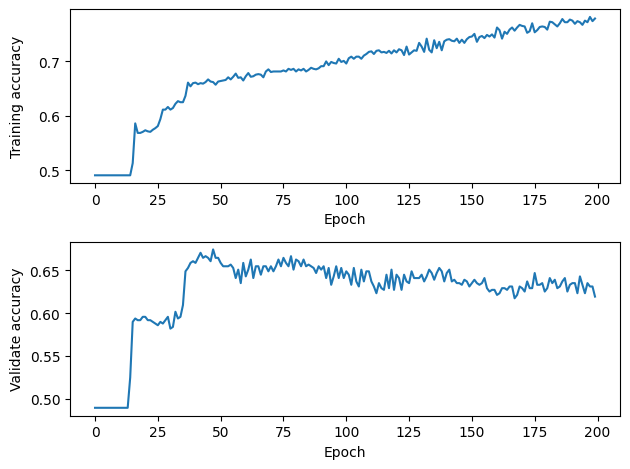

In [21]:
fig = plt.figure(tight_layout=True)
gs = gridspec.GridSpec(nrows=2, ncols=1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(train_accuracies)
ax.set_xlabel("Epoch")
ax.set_ylabel("Training accuracy")

ax = fig.add_subplot(gs[1, 0])
ax.plot(validate_accuracies)
ax.set_xlabel("Epoch")
ax.set_ylabel("Validate accuracy")

fig.align_labels()
plt.show()

In [48]:
def train_cv(cv=5, hidden_dim=hidden_dim, hidden_layers=hidden_layers, lr=0.1, num_epochs=500):
    cv_train_accuracies = []
    cv_validate_accuracies = []

    # train k number of times for cross validation
    for i in range(cv):
        pred_labels, train_accuracies, validate_accuracies = train_model(hidden_dim=hidden_dim, hidden_layers=hidden_layers, lr=lr, num_epochs=num_epochs)
        
        # append to accuracy list
        cv_train_accuracies.append(train_accuracies[-1])
        cv_validate_accuracies.append(validate_accuracies[-1])

    # calculate average score for train and validate set
    cv_train_accuracy = np.average(cv_train_accuracies)
    cv_validate_accuracy = np.average(cv_validate_accuracies)

    #print(f"cv_train_accuracies: {cv_train_accuracies}")
    #print(f"cv_validate_accuracies: {cv_validate_accuracies}")
    #print(f"cv_train_accuracy: {cv_train_accuracy}")
    #print(f"cv_validate_accuracy: {cv_validate_accuracy}")

    return pred_labels, cv_train_accuracy, cv_validate_accuracy

# test the method
pred_labels, cv_train_accuracy, cv_validate_accuracy = train_cv()

print(cv_train_accuracy)
print(cv_validate_accuracy)
print(pred_labels)

0.6913339793682098
0.5925049364566803
tensor([2, 0, 2, 1, 2, 0, 0, 1, 2, 2, 0, 2, 2, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0,
        0, 1, 1, 1, 2, 0, 1, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 1, 0, 1, 0, 1, 0, 2,
        0, 2, 0, 2, 0, 2, 1, 1, 0, 0, 1, 2, 0, 2, 2, 0, 0, 1, 1, 0, 2, 0, 0, 2,
        2, 2, 1, 0, 1, 1, 0, 0, 0, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 0, 1, 1, 1,
        0, 0, 2, 1, 2, 2, 1, 1, 1, 1, 0, 1, 2, 2, 0, 1, 0, 0, 2, 1, 2, 0, 2, 0,
        2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 2, 2, 2, 0, 1, 0, 1, 0, 2, 1, 0, 0, 0,
        0, 2, 2, 1, 0, 1, 0, 0, 2, 0, 2, 2, 0, 0, 0, 1, 2, 0, 2, 2, 0, 0, 2, 2,
        1, 2, 2, 0, 2, 1, 2, 2, 0, 1, 2, 2, 0, 2, 2, 2, 0, 0, 2, 1, 2, 1, 2, 2,
        0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 2, 1, 0, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2,
        2, 1, 0, 2, 2, 1, 1, 0, 2, 0, 0, 2, 0, 1, 2, 2, 0, 2, 1, 2, 2, 0, 2, 0,
        2, 0, 2, 2, 2, 2, 2, 1, 2, 2, 0, 0, 0, 1, 0, 2, 2, 2, 1, 2, 1, 0, 1, 1,
        0, 1, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 0, 0, 0, 1, 0, 1, 2, 0, 0, 0, 2, 0,
  

In [49]:
# parameter grid
hidden_dim = np.arange(8, 33, 8).tolist()
hidden_layers = np.arange(1, 6).tolist()
lr = [0.1, 0.01, 0.001]
num_epochs = np.arange(50, 301, 50).tolist()

print(f"hidden_dim: {hidden_dim}")
print(f"hidden_layers: {hidden_layers}")
print(f"lr: {lr}")
print(f"num_epochs: {num_epochs}\n")

train_accuracies = []
validate_accuracies = []

# start searching for optimal parameters
for i in range(len(hidden_dim)):
    for j in range(len(hidden_layers)):
        for e in range(len(num_epochs)):
            for l in range(len(lr)):
                
                print(f"hidden_dim: {hidden_dim[i]}, hidden_layers: {hidden_layers[j]}, num_epochs: {num_epochs[e]}, lr: {lr[l]}")
                
                pred_labels, cv_train_accuracy, cv_validate_accuracy = train_cv(hidden_dim=hidden_dim[i], hidden_layers=hidden_layers[j], lr=lr[l], num_epochs=num_epochs[e])

                train_accuracies.append({
                    "hidden_dim": hidden_dim[i],
                    "hidden_layers": hidden_layers[j],
                    "num_epochs": num_epochs[e],
                    "lr": lr[l],
                    "train_accuracy": cv_train_accuracy})
                
                validate_accuracies.append({
                    "hidden_dim": hidden_dim[i],
                    "hidden_layers": hidden_layers[j],
                    "num_epochs": num_epochs[e],
                    "lr": lr[l],
                    "validate_accuracy": cv_validate_accuracy})

# save results in dataframe
df_train_accuracies = pd.DataFrame(train_accuracies).sort_values(by=["hidden_dim", "hidden_layers", "num_epochs", "lr"]).reset_index(drop=True)
df_train_accuracies

# duration: 13 mins

hidden_dim: [8, 16, 24, 32]
hidden_layers: [1, 2, 3, 4, 5]
lr: [0.1, 0.01, 0.001]
num_epochs: [50, 100, 150, 200, 250, 300]

hidden_dim: 8, hidden_layers: 1, num_epochs: 50, lr: 0.1
hidden_dim: 8, hidden_layers: 1, num_epochs: 50, lr: 0.01
hidden_dim: 8, hidden_layers: 1, num_epochs: 50, lr: 0.001
hidden_dim: 8, hidden_layers: 1, num_epochs: 100, lr: 0.1
hidden_dim: 8, hidden_layers: 1, num_epochs: 100, lr: 0.01
hidden_dim: 8, hidden_layers: 1, num_epochs: 100, lr: 0.001
hidden_dim: 8, hidden_layers: 1, num_epochs: 150, lr: 0.1
hidden_dim: 8, hidden_layers: 1, num_epochs: 150, lr: 0.01
hidden_dim: 8, hidden_layers: 1, num_epochs: 150, lr: 0.001
hidden_dim: 8, hidden_layers: 1, num_epochs: 200, lr: 0.1
hidden_dim: 8, hidden_layers: 1, num_epochs: 200, lr: 0.01
hidden_dim: 8, hidden_layers: 1, num_epochs: 200, lr: 0.001
hidden_dim: 8, hidden_layers: 1, num_epochs: 250, lr: 0.1
hidden_dim: 8, hidden_layers: 1, num_epochs: 250, lr: 0.01
hidden_dim: 8, hidden_layers: 1, num_epochs: 250, lr:

,hidden_dim,hidden_layers,num_epochs,lr,train_accuracy
0,8,1,50,0.001,0.498539
1,8,1,50,0.010,0.646933
2,8,1,50,0.100,0.664460
3,8,1,100,0.001,0.566115
4,8,1,100,0.010,0.683544
...,...,...,...,...,...
355,32,5,250,0.010,0.906719
356,32,5,250,0.100,0.490750
357,32,5,300,0.001,0.744304
358,32,5,300,0.010,0.949951


In [52]:
#get the best combination of unit and layer in train_accuracies
df_train_accuracies[df_train_accuracies["train_accuracy"] == df_train_accuracies["train_accuracy"].max()]

,hidden_dim,hidden_layers,num_epochs,lr,train_accuracy
322,32,3,300,0.01,0.958715


In [50]:
df_validate_accuracies = pd.DataFrame(validate_accuracies).sort_values(by=["hidden_dim", "hidden_layers", "num_epochs", "lr"]).reset_index(drop=True)
df_validate_accuracies


,hidden_dim,hidden_layers,num_epochs,lr,validate_accuracy
0,8,1,50,0.001,0.493886
1,8,1,50,0.010,0.649704
2,8,1,50,0.100,0.637475
3,8,1,100,0.001,0.556213
4,8,1,100,0.010,0.640631
...,...,...,...,...,...
355,32,5,250,0.010,0.598422
356,32,5,250,0.100,0.489152
357,32,5,300,0.001,0.641420
358,32,5,300,0.010,0.608678


In [51]:
#get the best combination of unit and layer in validate_accuracies
df_validate_accuracies[df_validate_accuracies["validate_accuracy"] == df_validate_accuracies["validate_accuracy"].max()]

,hidden_dim,hidden_layers,num_epochs,lr,validate_accuracy
240,24,4,150,0.001,0.6643


In [36]:
y_validate, y_train_accuracies, y_validate_accuracies= train_model(X_tensor=X_tensor, y_tensor=y_tensor, X_test_tensor=X_tensor, hidden_dim=24, hidden_layers=4, lr=0.001, num_epochs=150)
#y_validate, y_train_accuracies, y_validate_accuracies= train_model(X_tensor=X_tensor, y_tensor=y_tensor, X_test_tensor=X_tensor, hidden_dim=32, hidden_layers=3, lr=0.01, num_epochs=300)
print(classification_report(y, y_validate))

              precision    recall  f1-score   support

         0.0       0.63      0.71      0.67       487
         1.0       0.57      0.52      0.54       295
         2.0       0.74      0.70      0.72       752

    accuracy                           0.67      1534
   macro avg       0.65      0.64      0.64      1534
weighted avg       0.67      0.67      0.67      1534



In [22]:
# use optimal model to train and get the label of y
y_test, y_test_train_accuracies, y_test_validate_accuracies= train_model(hidden_dim=24, hidden_layers=4, lr=0.001, num_epochs=150)

#y_test, y_test_train_accuracies, y_test_validate_accuracies= train_model(hidden_dim=32, hidden_layers=3, lr=0.01, num_epochs=300)
y_test

tensor([2, 2, 2, 1, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0,
        0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0, 1, 0, 2, 0, 2,
        2, 1, 0, 2, 0, 0, 0, 2, 0, 0, 1, 0, 0, 2, 0, 0, 0, 2, 1, 0, 2, 0, 0, 0,
        2, 2, 2, 0, 2, 1, 0, 0, 0, 1, 2, 2, 2, 0, 2, 1, 1, 2, 1, 2, 0, 1, 2, 1,
        0, 0, 0, 1, 2, 2, 2, 2, 1, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 1, 2, 0, 0, 0,
        2, 2, 0, 2, 0, 2, 0, 2, 1, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0,
        0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 2, 0, 0, 2,
        1, 2, 0, 0, 0, 2, 2, 0, 2, 1, 2, 2, 0, 0, 2, 0, 0, 0, 2, 1, 2, 1, 2, 2,
        0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 2, 2, 0, 2, 2, 2, 1, 2, 2, 2, 2, 2, 0, 1,
        2, 1, 2, 2, 0, 0, 1, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0,
        2, 0, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 2, 0, 0, 1,
        0, 1, 2, 0, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0,
        2, 0, 2, 0, 0, 1, 0, 0, 2, 0, 2,

In [23]:
export_file = "ANN_train_modeltrain_model(hidden_dim=24, hidden_layers=4, lr=0.001, num_epochs=150)"

## Ensemble - Bagging

In [59]:
# defining parameter range 
param_grid = {'n_estimators': [20,40,80,160],
              'max_samples': [0.5,0.8,1],
              'max_features': [0.5,0.8,1],
              'bootstrap': [True, False]}

# tuning
grid = GridSearchCV(BaggingClassifier(estimator=svm.SVC(C=1, gamma=0.0001), random_state=42), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y)

#duration: 6 mins

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=20;, score=0.489 total time=   0.1s
[CV 2/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=20;, score=0.489 total time=   0.2s
[CV 3/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=20;, score=0.492 total time=   0.2s
[CV 4/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=20;, score=0.492 total time=   0.2s
[CV 5/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=20;, score=0.490 total time=   0.2s
[CV 1/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=40;, score=0.489 total time=   0.4s
[CV 2/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=40;, score=0.489 total time=   0.4s
[CV 3/5] END bootstrap=True, max_features=0.5, max_samples=0.5, n_estimators=40;, score=0.492 total time=   0.4s
[CV 4/5] END bootstrap=True, max_f

GridSearchCV(estimator=BaggingClassifier(estimator=SVC(C=1, gamma=0.0001),
                                         random_state=42),
             param_grid={'bootstrap': [True, False],
                         'max_features': [0.5, 0.8, 1],
                         'max_samples': [0.5, 0.8, 1],
                         'n_estimators': [20, 40, 80, 160]},
             scoring='f1_micro', verbose=3)

In [60]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'bootstrap': True, 'max_features': 0.5, 'max_samples': 0.5, 'n_estimators': 20}
grid.best_estimator_: BaggingClassifier(estimator=SVC(C=1, gamma=0.0001), max_features=0.5,
                  max_samples=0.5, n_estimators=20, random_state=42)
grid.best_score_: 0.4902216261097273

classification_report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       487
         1.0       0.00      0.00      0.00       295
         2.0       0.49      1.00      0.66       752

    accuracy                           0.49      1534
   macro avg       0.16      0.33      0.22      1534
weighted avg       0.24      0.49      0.32      1534

export_file: BaggingClassifier(estimator=SVC(C=1,gamma=0.0001),max_features=0.5,max_samples=0.5,n_estimators=20,random_state=42)


## Ensemble - Random Forest

In [62]:
# defining parameter range 
param_grid = {'n_estimators': [20,40,80,160,320],
              'max_features': ['auto', 'sqrt'],
              'max_depth': [3,6,12,24],
              #'min_samples_split' : [2, 5, 10],
              #'min_samples_leaf' : [1, 2, 4],
              'bootstrap' : [True, False],
              'criterion': ["gini", "entropy", "log_loss"]}

# tuning
grid = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y) 

#duration: 2 mins

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=20;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=20;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=20;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=20;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=20;, score=nan total time=   0.0s
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=40;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=3, max_features=auto, n_estimators=40;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=3, max_featur

GridSearchCV(estimator=RandomForestClassifier(random_state=42),
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 6, 12, 24],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [20, 40, 80, 160, 320]},
             scoring='f1_micro', verbose=3)

In [63]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'bootstrap': False, 'criterion': 'gini', 'max_depth': 12, 'max_features': 'sqrt', 'n_estimators': 160}
grid.best_estimator_: RandomForestClassifier(bootstrap=False, max_depth=12, n_estimators=160,
                       random_state=42)
grid.best_score_: 0.717053075301782

classification_report:
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99       487
         1.0       1.00      0.98      0.99       295
         2.0       1.00      1.00      1.00       752

    accuracy                           0.99      1534
   macro avg       0.99      0.99      0.99      1534
weighted avg       0.99      0.99      0.99      1534

export_file: RandomForestClassifier(bootstrap=False,max_depth=12,n_estimators=160,random_state=42)


## Ensemble - Stacking

In [65]:
svmC = svm.SVC(C=1, gamma=0.0001)
knnC = KNeighborsClassifier(n_neighbors=6, p=1, weights='distance')
#dtC = DecisionTreeClassifier(max_depth=3,max_leaf_nodes=5)
#baggingC = BaggingClassifier(estimator=svm.SVC(C=1,gamma=0.0001),max_features=0.6,max_samples=0.9,n_estimators=160,random_state=42)
#boostingC = AdaBoostClassifier(learning_rate=0.30000000000000004, n_estimators=80)
rfC = RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=13, n_estimators=50)

estimators = [('svr', svmC),('knn', knnC),('rfc', rfC)]
#estimators = [('svr', svmC),('knn', knnC),('dt', dtC),('bagging', baggingC),('boosting', boostingC),('rfc', rfC)]

# defining parameter range 
param_grid = {'final_estimator': [svm.SVC(), KNeighborsClassifier(), DecisionTreeClassifier(), BaggingClassifier(), AdaBoostClassifier(), RandomForestClassifier(), LogisticRegression()],
              'passthrough': [True, False],
              #'stack_method': ['auto', 'predict_proba', 'decision_function', 'predict']
              }

# tuning
grid = GridSearchCV(StackingClassifier(estimators=estimators), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y) 

#duration: 2m

Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV 1/5] END final_estimator=SVC(), passthrough=True;, score=0.661 total time=   0.9s
[CV 2/5] END final_estimator=SVC(), passthrough=True;, score=0.723 total time=   1.1s
[CV 3/5] END final_estimator=SVC(), passthrough=True;, score=0.717 total time=   0.9s
[CV 4/5] END final_estimator=SVC(), passthrough=True;, score=0.707 total time=   0.9s
[CV 5/5] END final_estimator=SVC(), passthrough=True;, score=0.641 total time=   0.9s
[CV 1/5] END final_estimator=SVC(), passthrough=False;, score=0.684 total time=   0.8s
[CV 2/5] END final_estimator=SVC(), passthrough=False;, score=0.717 total time=   0.8s
[CV 3/5] END final_estimator=SVC(), passthrough=False;, score=0.723 total time=   0.9s
[CV 4/5] END final_estimator=SVC(), passthrough=False;, score=0.707 total time=   0.9s
[CV 5/5] END final_estimator=SVC(), passthrough=False;, score=0.663 total time=   0.9s
[CV 1/5] END final_estimator=KNeighborsClassifier(), passthrough=True;, sc

GridSearchCV(estimator=StackingClassifier(estimators=[('svr',
                                                       SVC(C=1, gamma=0.0001)),
                                                      ('knn',
                                                       KNeighborsClassifier(n_neighbors=6,
                                                                            p=1,
                                                                            weights='distance')),
                                                      ('rfc',
                                                       RandomForestClassifier(bootstrap=False,
                                                                              criterion='entropy',
                                                                              max_depth=13,
                                                                              n_estimators=50))]),
             param_grid={'final_estimator': [SVC(), KNeighborsClassifier(),
                                             DecisionTreeClassifier(),
                                             BaggingClassifier(),
                                             AdaBoostClassifier(),
                                             RandomForestClassifier(),
                                             LogisticRegression()],
                         'passthrough': [True, False]},
             scoring='f1_micro', verbose=3)

In [66]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

export_file = "StackingClassifier(estimators=['svr','knn','rfc'],final_estimator=LogisticRegression()"

grid.best_params_: {'final_estimator': LogisticRegression(), 'passthrough': False}
grid.best_estimator_: StackingClassifier(estimators=[('svr', SVC(C=1, gamma=0.0001)),
                               ('knn',
                                KNeighborsClassifier(n_neighbors=6, p=1,
                                                     weights='distance')),
                               ('rfc',
                                RandomForestClassifier(bootstrap=False,
                                                       criterion='entropy',
                                                       max_depth=13,
                                                       n_estimators=50))],
                   final_estimator=LogisticRegression())
grid.best_score_: 0.6988099039833088

classification_report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       487
         1.0       1.00      1.00      1.00       295
         2.0       1.00      1.0

## Ensemble - AdaBoosting

In [68]:
# defining parameter range 
param_grid = {'n_estimators': [20,40,80,160,320],
              'learning_rate': [0.001,0.01,0.1,0.3,0.5,0.7,0.9]}

# tuning
grid = GridSearchCV(AdaBoostClassifier(random_state=42), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y) 

Fitting 5 folds for each of 35 candidates, totalling 175 fits
[CV 1/5] END learning_rate=0.001, n_estimators=20;, score=0.567 total time=   0.0s
[CV 2/5] END learning_rate=0.001, n_estimators=20;, score=0.580 total time=   0.0s
[CV 3/5] END learning_rate=0.001, n_estimators=20;, score=0.554 total time=   0.0s
[CV 4/5] END learning_rate=0.001, n_estimators=20;, score=0.557 total time=   0.0s
[CV 5/5] END learning_rate=0.001, n_estimators=20;, score=0.559 total time=   0.0s
[CV 1/5] END learning_rate=0.001, n_estimators=40;, score=0.564 total time=   0.0s
[CV 2/5] END learning_rate=0.001, n_estimators=40;, score=0.580 total time=   0.0s
[CV 3/5] END learning_rate=0.001, n_estimators=40;, score=0.554 total time=   0.0s
[CV 4/5] END learning_rate=0.001, n_estimators=40;, score=0.557 total time=   0.0s
[CV 5/5] END learning_rate=0.001, n_estimators=40;, score=0.559 total time=   0.0s
[CV 1/5] END learning_rate=0.001, n_estimators=80;, score=0.564 total time=   0.0s
[CV 2/5] END learning_rat

GridSearchCV(estimator=AdaBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 0.3, 0.5, 0.7,
                                           0.9],
                         'n_estimators': [20, 40, 80, 160, 320]},
             scoring='f1_micro', verbose=3)

In [69]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'learning_rate': 0.9, 'n_estimators': 80}
grid.best_estimator_: AdaBoostClassifier(learning_rate=0.9, n_estimators=80, random_state=42)
grid.best_score_: 0.6759298290434523

classification_report:
              precision    recall  f1-score   support

         0.0       0.71      0.75      0.73       487
         1.0       0.72      0.61      0.66       295
         2.0       0.78      0.80      0.79       752

    accuracy                           0.75      1534
   macro avg       0.74      0.72      0.72      1534
weighted avg       0.74      0.75      0.74      1534

export_file: AdaBoostClassifier(learning_rate=0.9,n_estimators=80,random_state=42)


## Ensemble - Histogram-Based Gradient Boosting Classifier

In [71]:
# defining parameter range 
param_grid = {'max_depth': [4], 
              #'max_depth': [2,3,4,5,6,7,8,9,10],   
              'max_iter': [40,80,160], 
              'learning_rate': [0.001,0.01,0.1],
              'max_leaf_nodes': [21],
              #'max_leaf_nodes': [3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25],
              #'l2_regularization': [0.001,0.01,0.1],
              'l2_regularization': [0.1]
              }  
  
grid = GridSearchCV(HistGradientBoostingClassifier(random_state=42), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=40, max_leaf_nodes=21;, score=0.489 total time=   0.0s


[CV 2/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=40, max_leaf_nodes=21;, score=0.489 total time=   0.0s
[CV 3/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=40, max_leaf_nodes=21;, score=0.492 total time=   0.0s
[CV 4/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=40, max_leaf_nodes=21;, score=0.492 total time=   0.0s
[CV 5/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=40, max_leaf_nodes=21;, score=0.490 total time=   0.0s
[CV 1/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=80, max_leaf_nodes=21;, score=0.489 total time=   0.1s
[CV 2/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=80, max_leaf_nodes=21;, score=0.489 total time=   0.1s
[CV 3/5] END l2_regularization=0.1, learning_rate=0.001, max_depth=4, max_iter=80, max_leaf_nodes=21;, score=0.492 total time=   0.1s
[CV 4/5] END l2_regularization=0.1, learning_rate=0.001, max_d

GridSearchCV(estimator=HistGradientBoostingClassifier(random_state=42),
             param_grid={'l2_regularization': [0.1],
                         'learning_rate': [0.001, 0.01, 0.1], 'max_depth': [4],
                         'max_iter': [40, 80, 160], 'max_leaf_nodes': [21]},
             scoring='f1_micro', verbose=3)

In [72]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'l2_regularization': 0.1, 'learning_rate': 0.1, 'max_depth': 4, 'max_iter': 80, 'max_leaf_nodes': 21}
grid.best_estimator_: HistGradientBoostingClassifier(l2_regularization=0.1, max_depth=4, max_iter=80,
                               max_leaf_nodes=21, random_state=42)
grid.best_score_: 0.7020033637776499

classification_report:
              precision    recall  f1-score   support

         0.0       0.92      0.95      0.94       487
         1.0       0.96      0.89      0.93       295
         2.0       0.96      0.96      0.96       752

    accuracy                           0.94      1534
   macro avg       0.95      0.94      0.94      1534
weighted avg       0.95      0.94      0.94      1534

export_file: HistGradientBoostingClassifier(l2_regularization=0.1,max_depth=4,max_iter=80,max_leaf_nodes=21,random_state=42)


In [ ]:
'''
# best model
model = HistGradientBoostingClassifier(
    max_depth=4,
    max_iter=80,          # Adjust the number of boosting iterations
    learning_rate=0.1,     # Adjust the learning rate
    random_state=42,   
    scoring='f1_micro',          
    max_leaf_nodes = 21,
    l2_regularization = 0.1,
)
'''

This model can achieve a public score of 0.84756

## Ensemble - LightGradientBoosting(LGB) Classifier

In [80]:
# defining parameter range 
param_grid = {'reg_alpha':[0.01,0.05,0.1],
              'reg_lambda':[0.01,0.05,0.1],
              'learning_rate':[0.001,0.01,0.1],
              'max_depth':[3,6,12],
              'n_estimators': [50,100,200]}
  
grid = GridSearchCV(LGBMClassifier(), param_grid, scoring='f1_micro', refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(X, y) 

# duration: 6 mins

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 1227, number of used features: 30
[LightGBM] [Info] Start training from score -1.148748
[LightGBM] [Info] Start training from score -1.648496
[LightGBM] [Info] Start training from score -0.712070
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV 5/5] END learning_rate=0.001, max_depth=3, n_estimators=50, reg_alpha=0.01, reg_lambda=0.01;, score=0.490 total time=   0.0s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 1227, number of used features: 30
[LightGBM] [Info] Start training from score -1.148748
[LightGBM] [Info] Start training from score -1.648496
[LightGBM] [Info] Start tr

GridSearchCV(estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [3, 6, 12],
                         'n_estimators': [50, 100, 200],
                         'reg_alpha': [0.01, 0.05, 0.1],
                         'reg_lambda': [0.01, 0.05, 0.1]},
             scoring='f1_micro', verbose=3)

In [81]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

grid.best_params_: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'reg_alpha': 0.05, 'reg_lambda': 0.01}
grid.best_estimator_: LGBMClassifier(max_depth=3, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01)
grid.best_score_: 0.7392433629260607

classification_report:
              precision    recall  f1-score   support

         0.0       0.90      0.94      0.92       487
         1.0       0.94      0.88      0.91       295
         2.0       0.94      0.94      0.94       752

    accuracy                           0.93      1534
   macro avg       0.93      0.92      0.92      1534
weighted avg       0.93      0.93      0.93      1534

export_file: LGBMClassifier(max_depth=3,n_estimators=200,reg_alpha=0.05,reg_lambda=0.01)


## Ensemble - Extreme Gradient Boosting(XGB) Classifier

In [77]:
# defining parameter range 
param_grid = {'alpha':[0.001,0.01,0.1],
              'gamma':[0.001,0.01,0.1],
              'lambda':[0.001,0.01,0.1],
              'learning_rate':[0.001,0.01,0.1],
              'max_depth':[3,6,12],
              'n_estimators': [50,100,200],
              'subsample':[0.5,0.7,1]}
  
grid = GridSearchCV(XGBClassifier(), param_grid, scoring='f1_micro', refit = True, verbose = 3) 

# fitting the model for grid search 
grid.fit(X, y) 

# duration: 103 mins

Fitting 5 folds for each of 2187 candidates, totalling 10935 fits
[CV 1/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5;, score=0.648 total time=   0.0s


[CV 2/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5;, score=0.684 total time=   0.0s
[CV 3/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5;, score=0.700 total time=   0.0s
[CV 4/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5;, score=0.681 total time=   0.0s
[CV 5/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5;, score=0.676 total time=   0.0s
[CV 1/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.7;, score=0.648 total time=   0.0s
[CV 2/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.7;, score=0.687 total time=   0.0s
[CV 3/5] END alpha=0.001, gamma=0.001, lambda=0.001, learning_rate=0.001, max_depth=3, n_estim

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'alpha': [0.001, 0.01, 0.1],
                         'gamma': [0.001, 0.01, 0.1],
                         'lambda': [0.001, 0.01, 0.1],
                         'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [3, 6, 12],
                         'n_estimators': [50, 100, 200],
                         'subsample': [0.5, 0.7, 1]},
             scoring='f1_micro', verbose=3)

In [78]:
# print best parameter after tuning 
print(f"grid.best_params_: {grid.best_params_}") 
  
# print how our model looks after hyper-parameter tuning 
print(f"grid.best_estimator_: {grid.best_estimator_}") 

# print the best score
print(f"grid.best_score_: {grid.best_score_}") 

# make prediction on train set
y_grid = grid.predict(X) 
  
# print classification report 
print(f"\nclassification_report:\n{classification_report(y, y_grid)}")

# filename to save prediction result to csv
export_file = str(grid.best_estimator_).replace('\n', '').replace(' ', '')
print(f"export_file: {export_file}")

export_file = "XGBClassifier(alpha=0.001,gamma=0.001,lambda=0.1,learning_rate=0.1,max_depth=12,n_estimators=200)"

grid.best_params_: {'alpha': 0.001, 'gamma': 0.001, 'lambda': 0.1, 'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200, 'subsample': 0.5}
grid.best_estimator_: XGBClassifier(alpha=0.001, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.001, grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=0.1, learning_rate=0.1,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=12, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None, ...)
grid.best_score_: 0.7385982840476039

classification_report:
              precision    recall  f1-score   sup

# Final output

In [28]:
# make prediction on test set
y_test = grid.predict(X_test) 

In [25]:
# Create a DataFrame with predictions and index from df_test
df_y_test = pd.DataFrame(y_test, columns=['outcome'], index=sample_submission.id)

# Display the DataFrame with predictions
df_y_test.reset_index(inplace=True)
df_y_test.rename(columns={'index': 'id'}, inplace=True)
df_y_test

# Create a mapping dictionary
outcome_mapping = {0.0: 'died', 1.0: 'euthanized', 2.0: 'lived'}

# Map the values in the "outcome" column using the dictionary
df_y_test['outcome'] = df_y_test['outcome'].map(outcome_mapping)

# save prediction result to csv
df_y_test.to_csv(f"result_fe_nl/fe_nl_{export_file}.csv", index=False)

df_y_test

,id,outcome
0,1235,lived
1,1236,lived
2,1237,lived
3,1238,euthanized
4,1239,lived
...,...,...
819,2054,died
820,2055,euthanized
821,2056,died
822,2057,lived
